# Glycoproteomics Analysis Pipeline 
## For scanning swath glycoproteomics data extracted with DIA-NN

In [1]:
# Add folder with python environment to somewhere you have rwx access (default on OnDemand is not accessible)
python_env_path = '/camp/lab/ralserm/working/Glycoproteomics/Python Environment/'

In [2]:
# To install packages
#import sys
#sys.path.append(python_env_path)
#!pip install --target=python_env_path tqdm

In [3]:
# import libraries
import os
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
from itertools import islice
from multiprocessing import Pool
from python_env_path import tqdm
import setup_parameters as stp
%matplotlib inline 

In [4]:
# See where you are on camp / other computer
!pwd
# To make a new directory
# mkdir /path-to-new-directory

/camp/lab/ralserm/working/Glycoproteomics/CleanWorkflow


## Initialize paths to data

In [5]:
# Set Paths
# working directory -- has all the .py files
projdir = '/camp/lab/ralserm/working/Glycoproteomics/CleanWorkflow/'
wdir = projdir +'ExampleAnalysis/'
data_folder = wdir +'DataFromDIANN'

## Import functions for Glycoproteomics Analysis

In [6]:
# change to directory with all python files for Glycoproteomics to import code
os.chdir(wdir)

## 0. Setup parameters for analysis

In [7]:
# Parameters for peak assignment and integration

stp.setup_params(
    minimum_retention_time=0,
    maximum_retention_time=15,
    retention_time_step=1.1/60,
    retention_time_merging_distance=8,
    minimum_precursor_mz=800,
    maximum_precursor_mz=1600,
    precursor_mz_step=2,
    precursor_merging_distance=2,
    grid_unit_size=8,
    npeaks_for_persistance=100,
    selected_diagnostic_ion='138.055',
    data_folder = data_folder)

Parameters for analysis have been updated


In [8]:
from setup_parameters import *

In [9]:
# Import Glycoproteomics analysis code
import Glycoproteomics as glycoProt

Imported updated parameters from setup_parameters.py into Glycoproteomics.py


# Main Workflow

## 1. Load and Normalize data from one file

### Enter name of file to be analyzed

This is the .txt DIANN output file with extracted mass spectra

In [10]:
fname = '20201009_TOF2_AF_009_Kuebler_Glyco15min_P1_D1'

In [11]:
# Load data into a dictionary
data = glycoProt.load(data_folder + '/' + fname +'.wiff.dia.extracted.txt')

In [12]:
# To view structure of the data that was just imported -- look at first item in the dictionary
    # rt -- precursor mz -- glyco mz -- intensity
x = islice(data.items(), 0, 1)

for key, value in x:
    print (key, value)

0.00450036 {779.885: {'204.087': 0.0, '186.076': 0.0, '168.066': 0.0, '366.139': 0.0, '144.066': 0.0, '138.055': 0.0, '512.197': 0.0, '292.103': 0.0, '274.092': 0.0, '657.235': 0.0, '243.026': 0.0, '405.079': 0.0, '485.046': 0.0, '308.098': 0.0}}


### Visualize the different diagnostic glycosylation ions in the dataset

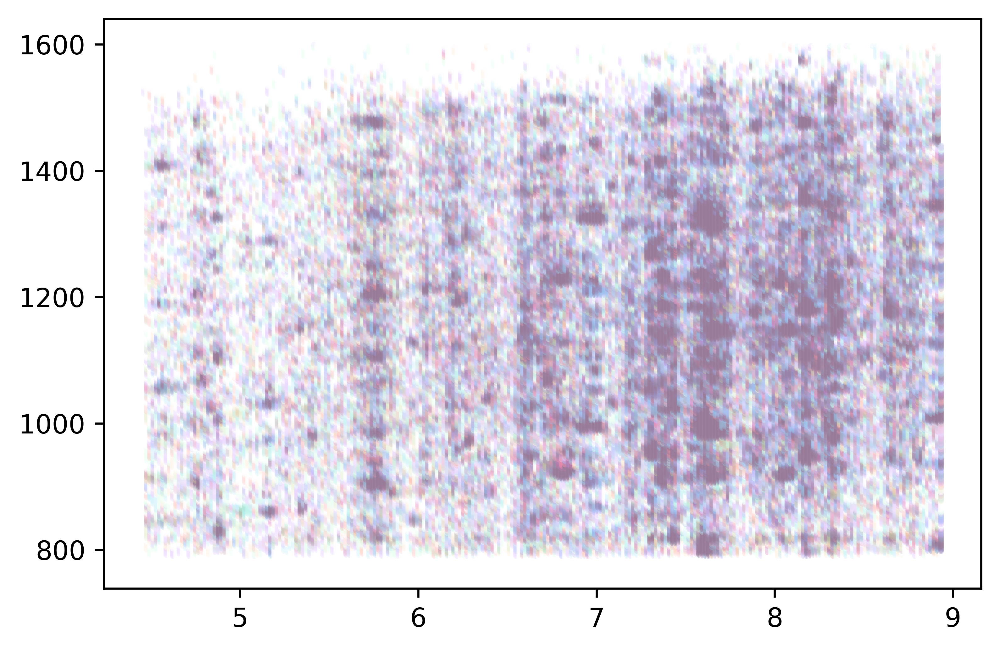

In [13]:
# Convert massspec dictionary data into x,y, color
x_data, y_data, color_data = glycoProt.convert_to_xyc(data,  ['138.055', '168.066', '204.087', '274.092', '366.139'])

# Plot all diagnostic ions in the data 
    # - only plotting 100000 values to save time 
    # - get rid of everything in [] to plot all
plt.figure(dpi=600)
plt.scatter(x_data[100000:200000], y_data[100000:200000], color=color_data[100000:200000], s=20, alpha=0.5, marker='.', edgecolor='')

### Visualize one diagnostic glycosylation ion in the dataset

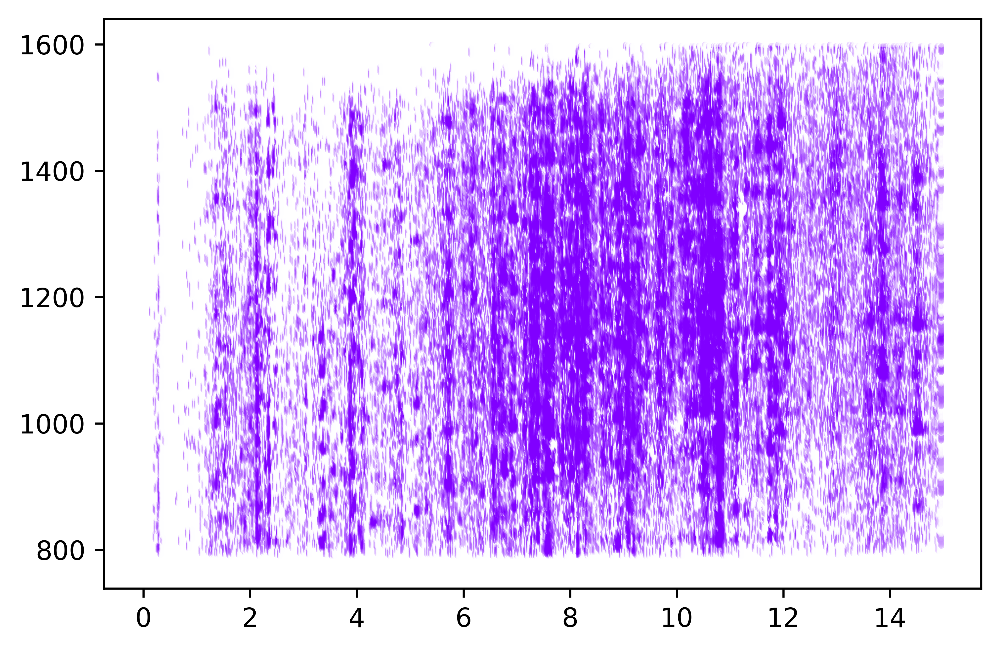

In [14]:
# Convert massspec dictionary data into x,y, color - for selected ion only
x_data, y_data, color_data = glycoProt.convert_to_xyc(data, ['138.055'])

plt.figure(dpi=600)
plt.scatter(x_data, y_data, color=color_data, s=20, alpha=0.5, marker='.', edgecolor='')
plt.show()

## 2. Resample Peaks to Matrix 

For the selected glyco diagnostic ion:
- extracts precursor mz , rt, and glyco ion intensity from the mass spectra dictionary
- bins it according to parameters specified in setup_parameters() 
- stores binned values in a matrix( rows: rt , columns mz , value in cells - intensity of diagnostic ion )

In [13]:
data_mat = glycoProt.resample_to_matrix(data,min_rt,max_rt,step_rt,min_mz,max_mz,step_mz,selected_ion)

In [14]:
# view dimensions of matrix
np.shape(data_mat)

(818, 400)

In [15]:
# view a subset of the matrix
data_mat[10:15,10:15]

array([[0.      , 0.      , 0.      , 0.      , 0.      ],
       [0.      , 0.      , 0.      , 0.      , 0.      ],
       [1.15578 , 1.15578 , 1.15578 , 1.15578 , 0.      ],
       [0.      , 0.      , 0.      , 0.      , 0.964503],
       [0.      , 0.      , 0.      , 0.      , 0.      ]])

## 3. Find peaks and estimate peak volume -- runs on all files in data folder
Finds peaks and ranks them according to how long they "persist" when the threshold (of diagnostic glyco ion intensity)is slowly lowered 
Then for the top npeaks (as specified in the parameter setup), integrates intensity values until peak vanishes into surroundings.

--- write more details about the estimate_intensity() funciton -- with sigma calculation etc


### Remember the next cell runs on ALL files in the data folder (by default)
- reads all ".wiff.dia.extracted.txt" within the data folder ( stored in files )
- resamples to matrix 
- calculates persistance 
- for top npeaks, estimates volume under peak
- writes rt,mz coordinates of centre of peak & estimated intensity of peak to file with fname + ".peaks.csv" extension in data_folder - for each file

In [16]:
# Make list of all files in data folder
files = [os.path.join(data_folder, file) for file in os.listdir(data_folder) if file.endswith(file_extension_ms)]
print('Persistance calculation will be carried out on '+ str(len(files)) +' files')

Persistance calculation will be carried out on 1 files


In [17]:
# Find peaks and estimate peak volumes

with Pool(4) as pool:
    persistance_result = list(tqdm.tqdm(pool.imap(glycoProt.process_peaks, files), total=len(files)))

100%|██████████| 1/1 [00:09<00:00,  9.15s/it]


### Take a look at the processed peaks ( for one file )

In [18]:
# Read in csv with peak info stored after running process_peaks
proc_peaks = pd.read_csv(data_folder + '/' + fname + '.peaks.csv',header=None)
proc_peaks.columns = ["rt","mz","Estimated.Intensity"]

In [19]:
proc_peaks
# rt & mz are of mid point of peak

,rt,mz,Estimated.Intensity
0,10.844167,1221.0,5295.012280
1,10.862500,979.0,6450.667532
2,11.797500,1151.0,3521.963429
3,8.185833,1181.0,1776.328616
4,10.844167,1017.0,1554.416895
...,...,...,...
95,7.305833,1173.0,220.510547
96,2.172500,1095.0,606.570546
97,6.609167,1151.0,147.152691
98,9.689167,1341.0,493.561314


### Visualize where the top npeaks are ( for one file )

In [20]:
proc_peaks_np = proc_peaks.transpose().to_numpy()

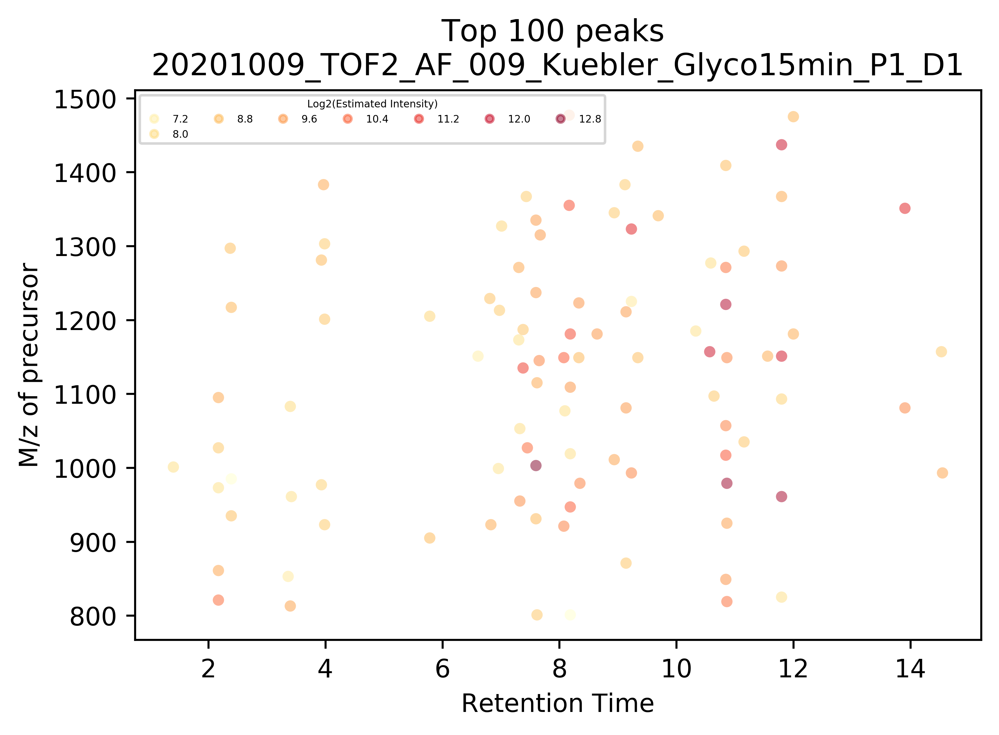

In [21]:
plt.figure(dpi=600)
scp=plt.scatter(x=proc_peaks_np[0],y=proc_peaks_np[1], c=np.log2(proc_peaks_np[2]), cmap='YlOrRd',s=20, alpha=0.5, marker='o', edgecolor='')
plt.title('Top '+str(npeaks)+' peaks \n'+fname)
plt.xlabel('Retention Time')
plt.ylabel('M/z of precursor')
plt.legend(handles=scp.legend_elements()[0],labels=scp.legend_elements()[1],loc='upper left',title='Log2(Estimated Intensity)',ncol=7,title_fontsize=4,fontsize=4,markerscale=0.5)
plt.show()

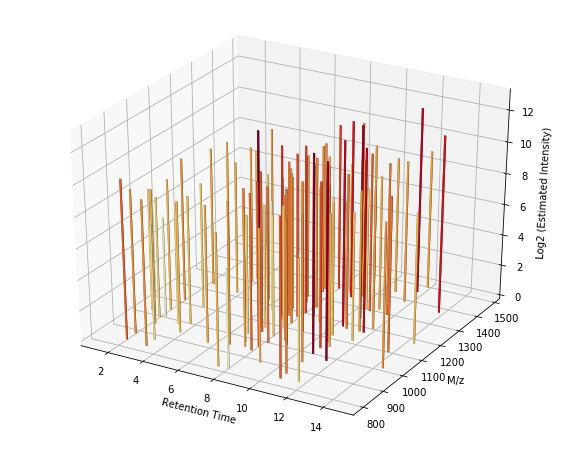

In [22]:
from mpl_toolkits.mplot3d import Axes3D

X,Y = proc_peaks_np[0],proc_peaks_np[1]
Z = np.log2(proc_peaks_np[2])

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')


colours= plt.cm.YlOrRd((Z-Z.min())/(Z.max()-Z.min()))
peaks3d = ax.bar3d(X, Y, np.zeros(len(Z)),.1,1,Z, color=colours,cmap='magma_r')

ax.set_xlabel('Retention Time')
ax.set_ylabel('M/z')
ax.set_zlabel('Log2 (Estimated Intensity)')

plt.show()

## 4. Merge / Concentrate Peaks
Need this for comparing samples for ML / other clustering 
Smaller peaks are merged together so that peak location / index across all samples are comparable
Step 1 : Creates a reference peak grid to which each sample will be compared
Step 2 : Merge peaks in each sample file to make them correspond to peak locations in the reference file

# Alternative workflows

## Use multiple diagnostic ions for a glycosylation
- ### Pick peaks on one ion and integrate peaks at that location with multiple ions

## Run multiple glycosylations
 - ### run loop through glycosylations and report all results in a single file ( but peaks picked separately and analyzed separately for each glycosylation )